# Business Understanding

Train a machine learning model to predict whether a customer is male or female

# Data Understanding

## Importation of all necessary packages

In [2]:
#importing all necessarry modules
#Data handling
import pandas as pd
import numpy as np

#Visualiation
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

#remove display limits
pd.set_option('display.max_columns', None)

#Machine Learning
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.linear_model import LogisticRegression 
from sklearn.metrics import *
from sklearn.model_selection import *
from datetime import datetime

import warnings
warnings.filterwarnings("ignore")  # Hiding the warnings

print('all modules loaded successfully')

all modules loaded successfully


## Read Data

In [3]:
#Read the data
df = pd.read_csv('dollar_tree-231012-195712.csv')
df

,index,Date,Year,Month,Customer Age,Customer Gender,Country,State,Product Category,Sub Category,Quantity,Unit Cost,Unit Price,Cost,Revenue,Column1
0,0,2/19/2016,2016.0,February,29.0,F,United States,Washington,Accessories,Tires and Tubes,1.0,80.00,109.000000,80.0,109.000000,NaN
1,1,2/20/2016,2016.0,February,29.0,F,United States,Washington,Clothing,Gloves,2.0,24.50,28.500000,49.0,57.000000,NaN
2,2,2/27/2016,2016.0,February,29.0,F,United States,Washington,Accessories,Tires and Tubes,3.0,3.67,5.000000,11.0,15.000000,NaN
3,3,3/12/2016,2016.0,March,29.0,F,United States,Washington,Accessories,Tires and Tubes,2.0,87.50,116.500000,175.0,233.000000,NaN
4,4,3/12/2016,2016.0,March,29.0,F,United States,Washington,Accessories,Tires and Tubes,3.0,35.00,41.666667,105.0,125.000000,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34862,34862,2/7/2016,2016.0,February,38.0,M,France,Hauts de Seine,Bikes,Mountain Bikes,2.0,1160.00,985.500000,2320.0,1971.000000,NaN
34863,34863,3/13/2015,2015.0,March,38.0,M,France,Hauts de Seine,Bikes,Mountain Bikes,1.0,2049.00,1583.000000,2049.0,1583.000000,NaN
34864,34864,4/5/2015,2015.0,April,38.0,M,France,Hauts de Seine,Bikes,Mountain Bikes,3.0,683.00,560.666667,2049.0,1682.000000,NaN
34865,34865,8/30/2015,2015.0,August,38.0,M,France,Hauts de Seine,Bikes,Mountain Bikes,1.0,2320.00,1568.000000,2320.0,1568.000000,NaN


*The dataset has 34,867 records across 16 columns*

In [4]:
#checking number of unique items in each column
df.nunique()

index               34867
Date                  576
Year                    2
Month                  12
Customer Age           70
Customer Gender         2
Country                 4
State                  45
Product Category        3
Sub Category           17
Quantity                3
Unit Cost             882
Unit Price           5175
Cost                  417
Revenue              3023
Column1              1281
dtype: int64

## Perform a `brief` EDA  (info(), describe(), corr() etc)

In [5]:
#Checking overall info and datatype of each column
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34867 entries, 0 to 34866
Data columns (total 16 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   index             34867 non-null  int64  
 1   Date              34866 non-null  object 
 2   Year              34866 non-null  float64
 3   Month             34866 non-null  object 
 4   Customer Age      34866 non-null  float64
 5   Customer Gender   34866 non-null  object 
 6   Country           34866 non-null  object 
 7   State             34866 non-null  object 
 8   Product Category  34866 non-null  object 
 9   Sub Category      34866 non-null  object 
 10  Quantity          34866 non-null  float64
 11  Unit Cost         34866 non-null  float64
 12  Unit Price        34866 non-null  float64
 13  Cost              34866 non-null  float64
 14  Revenue           34867 non-null  float64
 15  Column1           2574 non-null   float64
dtypes: float64(8), int64(1), object(7)
memor

In [166]:
#converting date to datetime
df['Date'] = pd.to_datetime(df['Date'], format='mixed', dayfirst = True)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34867 entries, 0 to 34866
Data columns (total 16 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   index             34867 non-null  int64         
 1   Date              34866 non-null  datetime64[ns]
 2   Year              34866 non-null  float64       
 3   Month             34866 non-null  object        
 4   Customer Age      34866 non-null  float64       
 5   Customer Gender   34866 non-null  object        
 6   Country           34866 non-null  object        
 7   State             34866 non-null  object        
 8   Product Category  34866 non-null  object        
 9   Sub Category      34866 non-null  object        
 10  Quantity          34866 non-null  float64       
 11  Unit Cost         34866 non-null  float64       
 12  Unit Price        34866 non-null  float64       
 13  Cost              34866 non-null  float64       
 14  Revenue           3486

### Notes: ###
    1. The dataset has a total of 16 columns.
    2. The columns are divided into three datatypes, int64, object and float64
    3. The int column is the index so it's not relevant in any analytical manner

In [6]:
#Checking total null values
df.isnull().sum()

index                   0
Date                    1
Year                    1
Month                   1
Customer Age            1
Customer Gender         1
Country                 1
State                   1
Product Category        1
Sub Category            1
Quantity                1
Unit Cost               1
Unit Price              1
Cost                    1
Revenue                 0
Column1             32293
dtype: int64

### Notes : ###
    The data has one missing observation across all columns except Revenue. could be a duplicate
    Column 1 has 32,293 missing values

In [168]:
#checking for duplicates
df.duplicated().sum()

0

*There are no duplicates*

In [169]:
#checking column 1
df.Column1
#The column has no desscription and no data that seems to be useful, it is a repetition of some of the values in the Revenue Column
#Best to drop it

0       NaN
1       NaN
2       NaN
3       NaN
4       NaN
         ..
34862   NaN
34863   NaN
34864   NaN
34865   NaN
34866   NaN
Name: Column1, Length: 34867, dtype: float64

In [170]:
#describing only the numeric columns in the data
df.describe(exclude = ['int64', 'object']).T

,count,mean,min,25%,50%,75%,max,std
Date,34866,2016-01-21 23:38:38.843572736,2015-01-01 00:00:00,2015-10-10 00:00:00,2016-01-31 00:00:00,2016-05-21 00:00:00,2016-12-07 00:00:00,NaN
Year,34866.0,2015.569237,2015.0,2015.0,2016.0,2016.0,2016.0,0.49519
Customer Age,34866.0,36.382895,17.0,28.0,35.0,44.0,87.0,11.112902
Quantity,34866.0,2.002524,1.0,1.0,2.0,3.0,3.0,0.813936
Unit Cost,34866.0,349.880567,0.67,45.0,150.0,455.0,3240.0,490.015846
Unit Price,34866.0,389.232485,0.666667,53.666667,179.0,521.0,5082.0,525.319091
Cost,34866.0,576.004532,2.0,85.0,261.0,769.0,3600.0,690.500395
Revenue,34867.0,640.870093,2.0,102.0,319.0,902.0,5082.0,736.640033
Column1,2574.0,688.054913,2.0,104.25,390.5,975.75,3681.0,774.200897


## Notes: ##
    1. The data ranges from 2015 to 2016
    2. The customer age ranges from 17 to 87 and the mean age is 36.38 years
    3. The average unit cost is 349, unit price is 389, cost is 576 and revenue is 640

In [171]:
#creating a list of all categorical columns
categoricals = []
cols = df.select_dtypes(include = 'object')
for col in cols:
    categoricals.append(col)
categoricals

['Month',
 'Customer Gender',
 'Country',
 'State',
 'Product Category',
 'Sub Category']

In [172]:
#creating a list of all numerical columns
numericals = []
cols = df.select_dtypes(include = 'float')
for col in cols:
    numericals.append(col)
numericals

['Year',
 'Customer Age',
 'Quantity',
 'Unit Cost',
 'Unit Price',
 'Cost',
 'Revenue',
 'Column1']

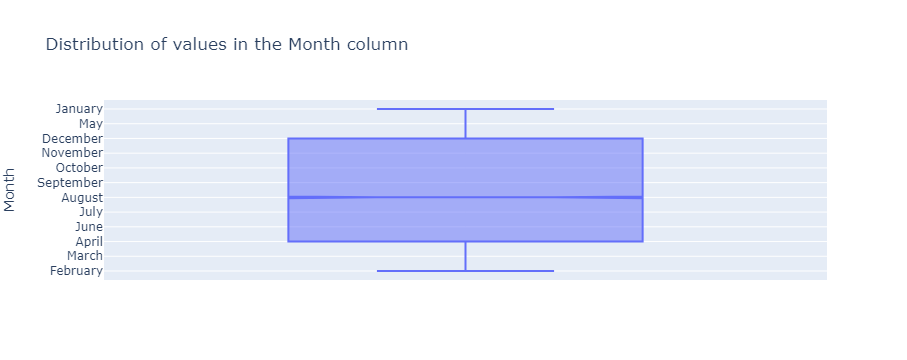

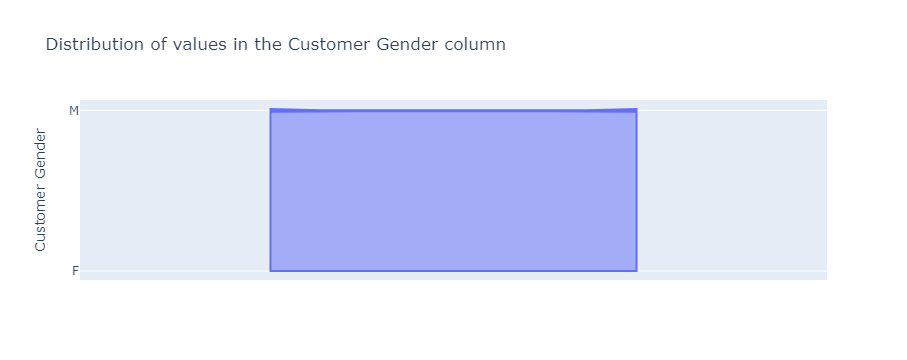

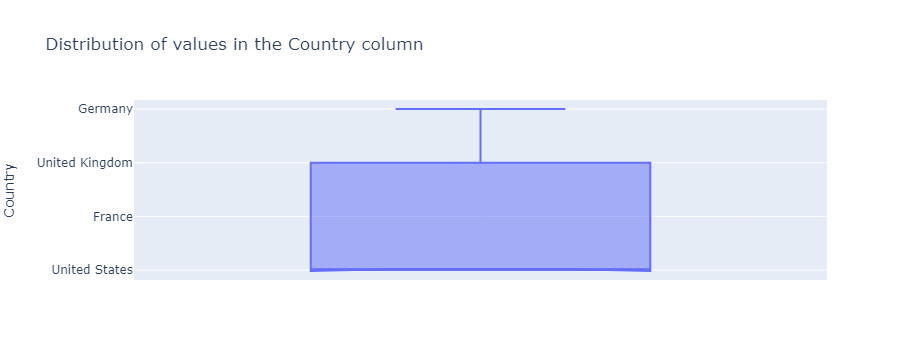

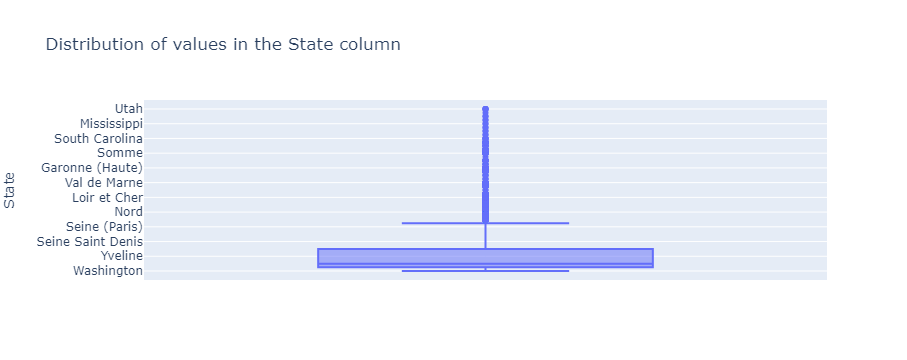

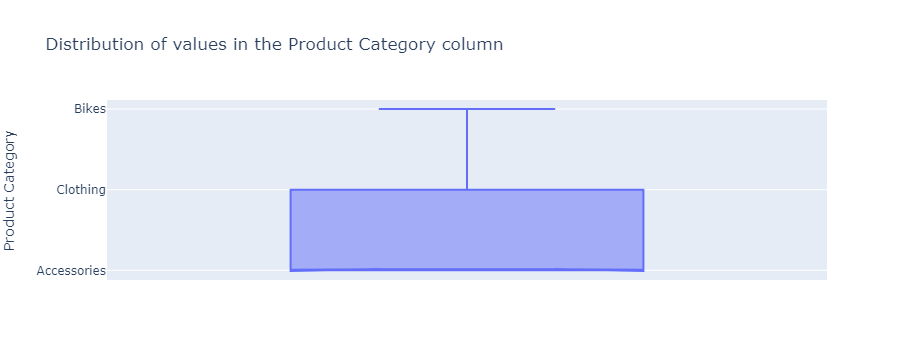

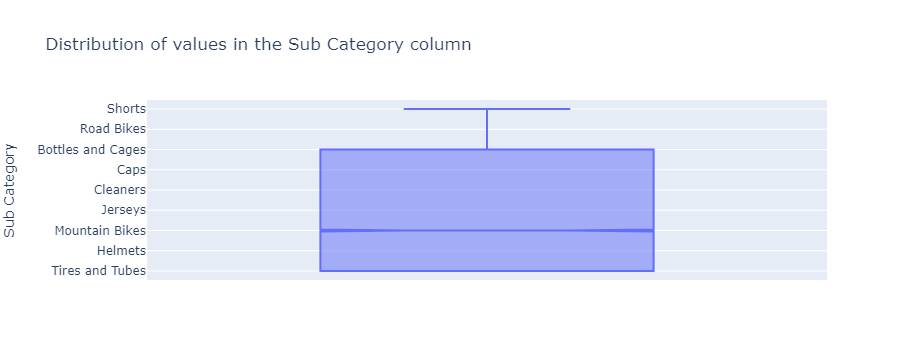

In [173]:
#Visual representation of categorical columns
for col in categoricals:
    fig = px.box(df, y=col, notched = True,
                 title = f"Distribution of values in the {col} column")
    fig.show()

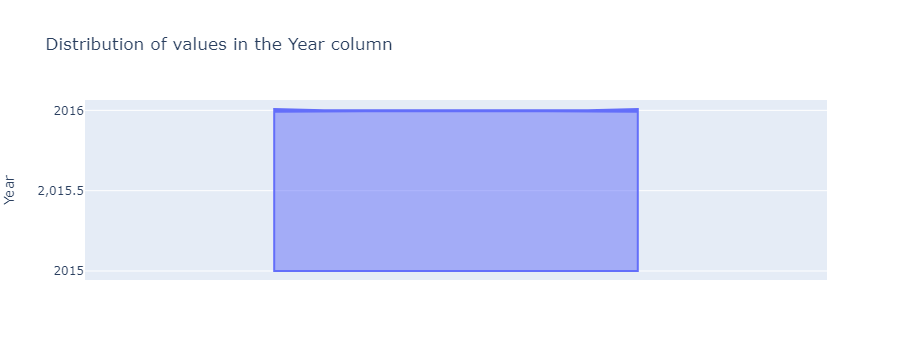

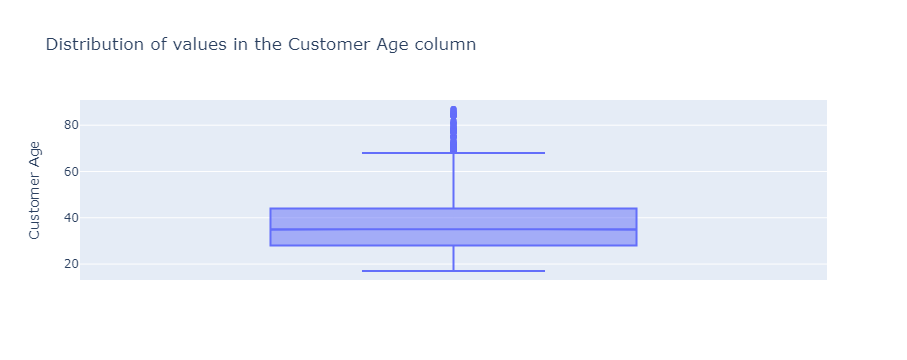

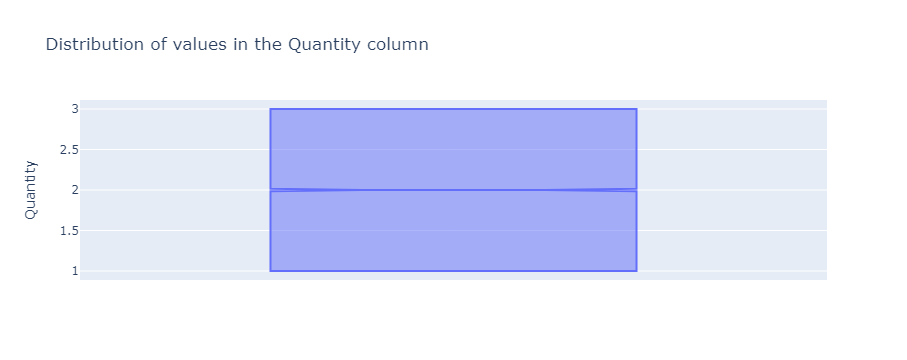

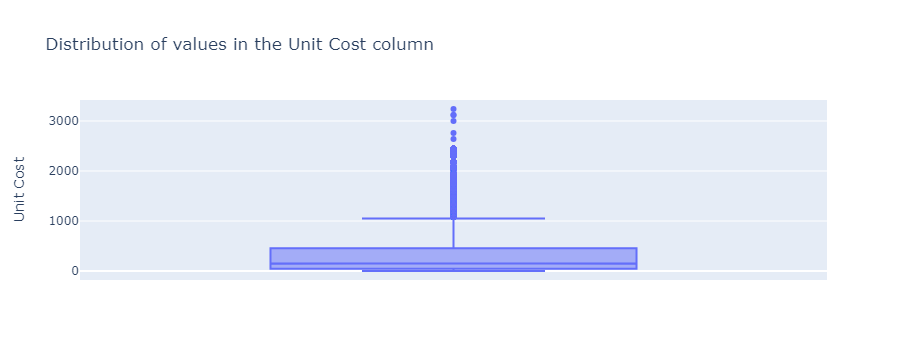

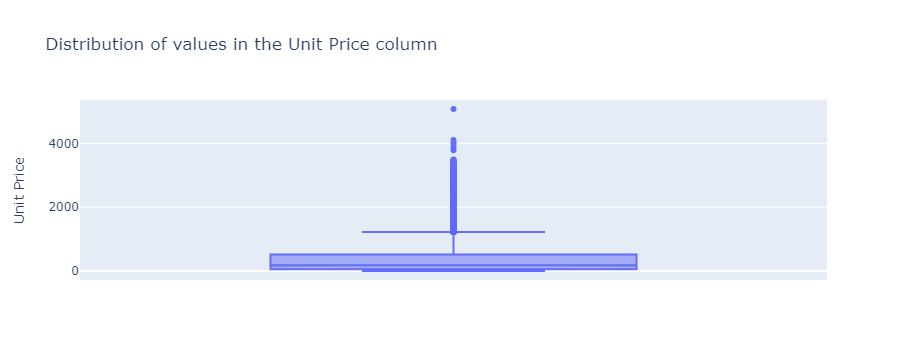

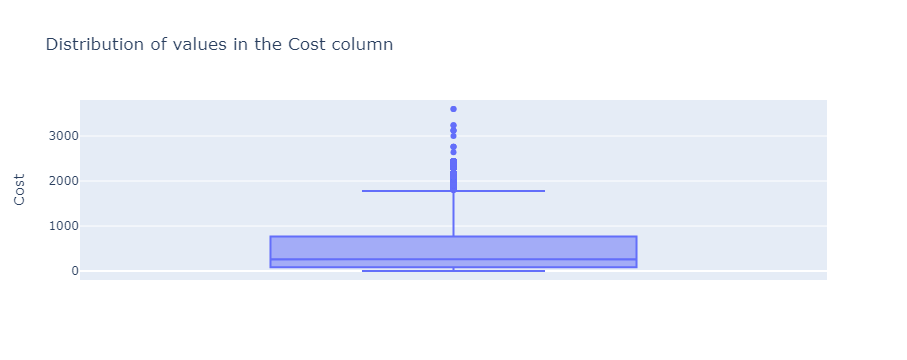

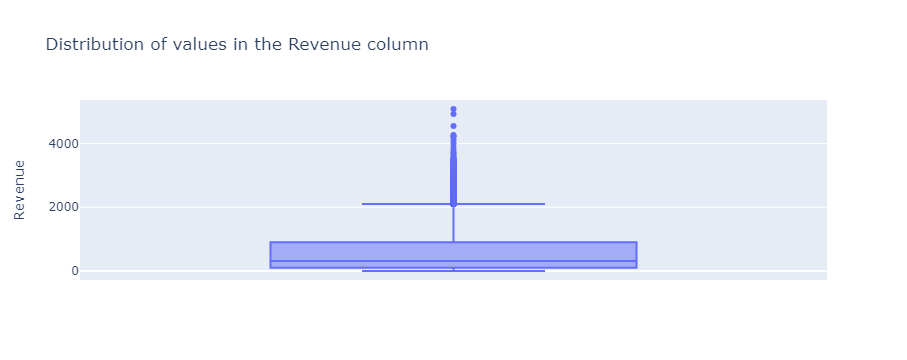

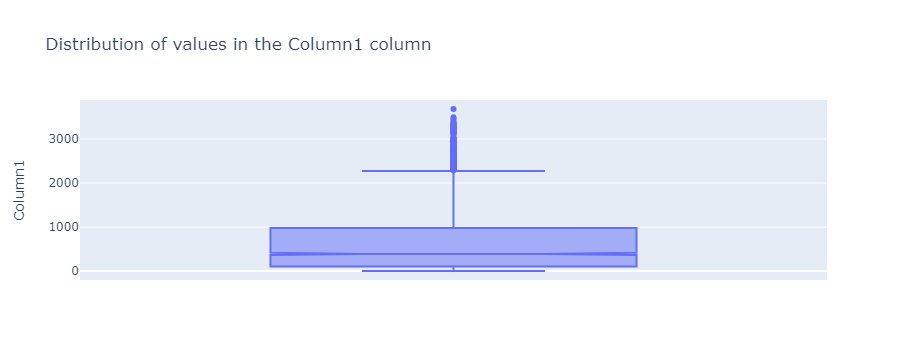

In [174]:
#Visual representation of numerical columns
for col in numericals:
    fig = px.box(df, y=col, notched = True,
                title = f"Distribution of values in the {col} column")
    fig.show()

In [175]:
# correlation of the variables
corr_matrix = df[numericals].corr()
corr_matrix

,Year,Customer Age,Quantity,Unit Cost,Unit Price,Cost,Revenue,Column1
Year,1.000000,0.049873,0.000919,-0.073245,-0.022628,-0.084566,-0.025361,-0.025333
Customer Age,0.049873,1.000000,0.004383,0.022362,0.023412,0.023641,0.024836,0.001198
Quantity,0.000919,0.004383,1.000000,-0.312514,-0.324109,0.008295,0.008418,-0.024744
Unit Cost,-0.073245,0.022362,-0.312514,1.000000,0.981033,0.854908,0.836957,0.021894
Unit Price,-0.022628,0.023412,-0.324109,0.981033,1.000000,0.832968,0.851034,0.019971
Cost,-0.084566,0.023641,0.008295,0.854908,0.832968,1.000000,0.979119,0.024892
Revenue,-0.025361,0.024836,0.008418,0.836957,0.851034,0.979119,1.000000,0.022325
Column1,-0.025333,0.001198,-0.024744,0.021894,0.019971,0.024892,0.022325,1.000000


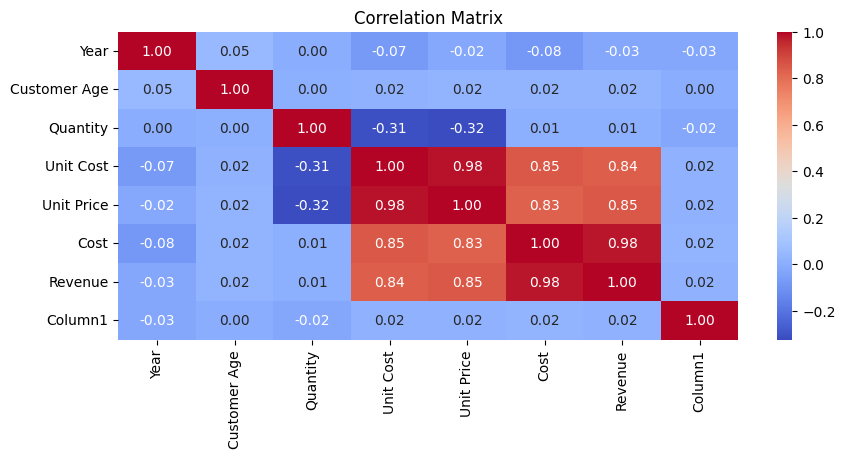

In [176]:
#Visualiing the correlation
plt.figure(figsize=(10, 4))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Matrix")
plt.show()

## EDA INSIGHTS:
    The data is mostly clean with only one missing value across the columns. For ease, we will drop it as one record will probably not affect our model.
    The Index and Column1 columns are not useful in the model building
    The Year and Month columns are a repetition and will not be needed as all the information is still contained in the Date column

In [177]:
#defining columns to potentially drop
cols_to_drop = ['index', 'Column1', 'Date', 'Year', 'Product Category', 'Unit Price', 'Unit Cost', 'Cost']

# `Data Preparation`

## Data Cleaning

In [178]:
#dropping columns
df.drop(cols_to_drop, axis = 1, inplace = True)
df

,Month,Customer Age,Customer Gender,Country,State,Sub Category,Quantity,Revenue
0,February,29.0,F,United States,Washington,Tires and Tubes,1.0,109.000000
1,February,29.0,F,United States,Washington,Gloves,2.0,57.000000
2,February,29.0,F,United States,Washington,Tires and Tubes,3.0,15.000000
3,March,29.0,F,United States,Washington,Tires and Tubes,2.0,233.000000
4,March,29.0,F,United States,Washington,Tires and Tubes,3.0,125.000000
...,...,...,...,...,...,...,...,...
34862,February,38.0,M,France,Hauts de Seine,Mountain Bikes,2.0,1971.000000
34863,March,38.0,M,France,Hauts de Seine,Mountain Bikes,1.0,1583.000000
34864,April,38.0,M,France,Hauts de Seine,Mountain Bikes,3.0,1682.000000
34865,August,38.0,M,France,Hauts de Seine,Mountain Bikes,1.0,1568.000000


In [179]:
#dropping the last row with no values except the Revenue
df = df.dropna()
df

,Month,Customer Age,Customer Gender,Country,State,Sub Category,Quantity,Revenue
0,February,29.0,F,United States,Washington,Tires and Tubes,1.0,109.0
1,February,29.0,F,United States,Washington,Gloves,2.0,57.0
2,February,29.0,F,United States,Washington,Tires and Tubes,3.0,15.0
3,March,29.0,F,United States,Washington,Tires and Tubes,2.0,233.0
4,March,29.0,F,United States,Washington,Tires and Tubes,3.0,125.0
...,...,...,...,...,...,...,...,...
34861,March,38.0,M,France,Charente-Maritime,Mountain Bikes,1.0,1487.0
34862,February,38.0,M,France,Hauts de Seine,Mountain Bikes,2.0,1971.0
34863,March,38.0,M,France,Hauts de Seine,Mountain Bikes,1.0,1583.0
34864,April,38.0,M,France,Hauts de Seine,Mountain Bikes,3.0,1682.0


In [180]:
#checking for nulls in the dataset
df.isnull().sum()

Month              0
Customer Age       0
Customer Gender    0
Country            0
State              0
Sub Category       0
Quantity           0
Revenue            0
dtype: int64

In [181]:
#renaming the columns with space
df.columns = df.columns.str.replace(' ', '_')
df.columns

Index(['Month', 'Customer_Age', 'Customer_Gender', 'Country', 'State',
       'Sub_Category', 'Quantity', 'Revenue'],
      dtype='object')

In [182]:
#renaming columns
df.rename(columns={'Customer_Age': 'age', 'Customer_Gender': 'gender', 'Sub_Category':'product'}, inplace=True)
df

,Month,age,gender,Country,State,product,Quantity,Revenue
0,February,29.0,F,United States,Washington,Tires and Tubes,1.0,109.0
1,February,29.0,F,United States,Washington,Gloves,2.0,57.0
2,February,29.0,F,United States,Washington,Tires and Tubes,3.0,15.0
3,March,29.0,F,United States,Washington,Tires and Tubes,2.0,233.0
4,March,29.0,F,United States,Washington,Tires and Tubes,3.0,125.0
...,...,...,...,...,...,...,...,...
34861,March,38.0,M,France,Charente-Maritime,Mountain Bikes,1.0,1487.0
34862,February,38.0,M,France,Hauts de Seine,Mountain Bikes,2.0,1971.0
34863,March,38.0,M,France,Hauts de Seine,Mountain Bikes,1.0,1583.0
34864,April,38.0,M,France,Hauts de Seine,Mountain Bikes,3.0,1682.0


## Divide data into input and output

In [190]:
#Dividing the Data into X and y variables
X = df.loc[:, df.columns != 'gender'] #predictor variables
y = df['gender'] #predicted variable
X 

,Month,age,Country,State,product,Quantity,Revenue
0,3,29.0,3,42,14,1.0,109.0
1,3,29.0,3,42,6,2.0,57.0
2,3,29.0,3,42,14,3.0,15.0
3,7,29.0,3,42,14,2.0,233.0
4,7,29.0,3,42,14,3.0,125.0
...,...,...,...,...,...,...,...
34861,7,38.0,0,5,10,1.0,1487.0
34862,3,38.0,0,12,10,2.0,1971.0
34863,7,38.0,0,12,10,1.0,1583.0
34864,0,38.0,0,12,10,3.0,1682.0


In [192]:
#Train test Split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=22)
print('Data has been split for modelling')

Data has been split for modelling


## Encoding

### 1. Encode the target column (the labels)


In [187]:
#creating a list of all categorical columns
categoricals2 = []
cols = df.select_dtypes(include = 'object')
for col in cols:
    categoricals2.append(col)
categoricals2

['Month', 'gender', 'Country', 'State', 'product']

In [188]:
#Encoding Gender column
label_encoder = LabelEncoder()
df['gender'] = label_encoder.fit_transform(df['gender'])
df

,Month,age,gender,Country,State,product,Quantity,Revenue
0,February,29.0,0,United States,Washington,Tires and Tubes,1.0,109.0
1,February,29.0,0,United States,Washington,Gloves,2.0,57.0
2,February,29.0,0,United States,Washington,Tires and Tubes,3.0,15.0
3,March,29.0,0,United States,Washington,Tires and Tubes,2.0,233.0
4,March,29.0,0,United States,Washington,Tires and Tubes,3.0,125.0
...,...,...,...,...,...,...,...,...
34861,March,38.0,1,France,Charente-Maritime,Mountain Bikes,1.0,1487.0
34862,February,38.0,1,France,Hauts de Seine,Mountain Bikes,2.0,1971.0
34863,March,38.0,1,France,Hauts de Seine,Mountain Bikes,1.0,1583.0
34864,April,38.0,1,France,Hauts de Seine,Mountain Bikes,3.0,1682.0


### 2. Encode categorical columns

In [189]:
#Encoding categorical columns
for col in categoricals2:
    label_encoder = LabelEncoder()
    df[col] = label_encoder.fit_transform(df[col]) 
#product codes 0 is Accessories, 1 is Bikes and 2 is Clothing
df

,Month,age,gender,Country,State,product,Quantity,Revenue
0,3,29.0,0,3,42,14,1.0,109.0
1,3,29.0,0,3,42,6,2.0,57.0
2,3,29.0,0,3,42,14,3.0,15.0
3,7,29.0,0,3,42,14,2.0,233.0
4,7,29.0,0,3,42,14,3.0,125.0
...,...,...,...,...,...,...,...,...
34861,7,38.0,1,0,5,10,1.0,1487.0
34862,3,38.0,1,0,12,10,2.0,1971.0
34863,7,38.0,1,0,12,10,1.0,1583.0
34864,0,38.0,1,0,12,10,3.0,1682.0


# REMINDER!!!
### Replace original categorical columns with encoded ones
##### Don't forget Reset indices to ensure proper alignment when I concatenate


# `Modeling`

In [200]:
#Modeling for prediction using Logistic Regressor
#Logistic Regression
log_reg = LogisticRegression(random_state=22, n_jobs = -1)
log_reg_model = log_reg.fit(X_train,  y_train)

# Making predictions on X
x_pred = log_reg_model.predict(X_test)
x_pred

array([1, 1, 1, ..., 1, 1, 0], dtype=int64)

In [203]:
# Making predictions probabilities on X
log_reg_pred_proba = log_reg_model.predict_proba(X_test)

log_reg_pred_proba

array([[0.48722717, 0.51277283],
       [0.4672125 , 0.5327875 ],
       [0.4925771 , 0.5074229 ],
       ...,
       [0.46609746, 0.53390254],
       [0.47801462, 0.52198538],
       [0.50363577, 0.49636423]])

# `Evaluation`

### Plot the confusion Matrix using  `matplotlib` and or `seaborn`

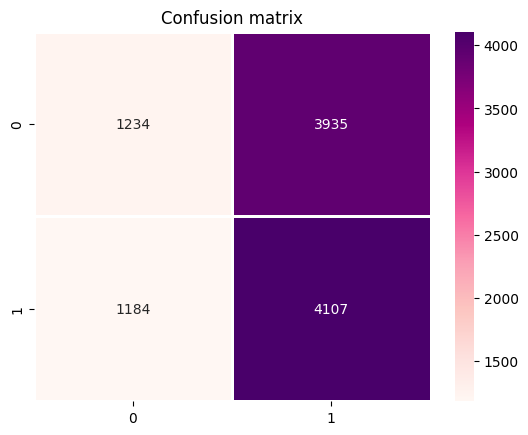

In [204]:
# Defining the Confusion Matrix 
lr_conf_mat = confusion_matrix(y_test, log_reg_pred)
lr_conf_mat = pd.DataFrame(lr_conf_mat).reset_index(drop=True)

# Visualizing the Confusion Matrix
f, ax = plt.subplots()
sns.heatmap(lr_conf_mat, annot=True, linewidth=1.0, fmt=".0f", cmap="RdPu", ax=ax)
plt.xlabel = ("y_pred")
plt.ylabel = ("y_true")
plt.title("Confusion matrix")
plt.show()

### Build a classification Report

In [207]:
#Printing the Classification Report
accuracy = accuracy_score(y_test, x_pred) 
conf_matrix = confusion_matrix(y_test, x_pred) 
class_report = classification_report(y_test, x_pred) 
print(f"Accuracy: {accuracy:.2f}")
print("Classification Report:")
print(class_report)

Accuracy: 0.51
Classification Report:
              precision    recall  f1-score   support

           0       0.51      0.24      0.33      5169
           1       0.51      0.78      0.62      5291

    accuracy                           0.51     10460
   macro avg       0.51      0.51      0.47     10460
weighted avg       0.51      0.51      0.47     10460



##### The logistic regression model performs averagely on precision but is better on recall and the general f1 score.


##### To retrain using xgboost and other ML libraries to try and improve performance